<a href="https://colab.research.google.com/github/arnav-meduri/PVO-segmentation/blob/main/pytorch_unet_resnet18_arnav_aug24_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## pytorch-uent

https://github.com/usuyama/pytorch-unet

In [1]:
import os

if not os.path.exists("pytorch_unet.py"):
  if not os.path.exists("pytorch_unet"):
    !git clone https://github.com/usuyama/pytorch-unet.git

  %cd pytorch-unet

Cloning into 'pytorch-unet'...
remote: Enumerating objects: 67, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 67 (delta 6), reused 10 (delta 5), pack-reused 55
Receiving objects: 100% (67/67), 338.19 KiB | 10.25 MiB/s, done.
Resolving deltas: 100% (24/24), done.
/content/pytorch-unet


In [2]:
!pip install 'git+https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup'

  Cloning https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup to /tmp/pip-req-build-3mejjg5v
  Running command git clone --filter=blob:none --quiet https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup /tmp/pip-req-build-3mejjg5v
  Resolved https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup to commit 12d03c07553aedd3d9e9155e2b3e31ce8c64081a
  Preparing metadata (setup.py) ... done
  Created wheel for cosine-annealing-warmup: filename=cosine_annealing_warmup-2.0-py3-none-any.whl size=4165 sha256=e6604e813d4316a6cae91f21502b5744b62fe98a118a03e620e01e8827b99aef
  Stored in directory: /tmp/pip-ephem-wheel-cache-bg5nwp7b/wheels/29/26/10/bf1a07417dd54aa73bdf09ce4f31c187974a444a1cedddbd99
Successfully built cosine-annealing-warmup


## Enabling GPU on Colab

Need to enable GPU from Notebook settings

- Navigate to Edit-Notebook settings menu
- Select GPU from the Hardware Accelerator dropdown list


In [3]:
import torch

if not torch.cuda.is_available():
  raise Exception("GPU not availalbe. CPU training will be too slow.")

print("device name", torch.cuda.get_device_name(0))

device name Tesla V100-SXM2-16GB


## Synthetic images for demo training

In [4]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [5]:
! ls "/content/drive/.shortcut-targets-by-id/1Gd6Qvx67HvZr5HE48UMhRc2vhUfBl1Jh/PVO_Segmentation_Project/Processed_Images/jul29/BB_Annotated_Masked_Gray_Downsampled_ALL/" | wc -l

71


In [6]:
! mkdir -p /content/Original_Images
! mkdir -p /content/Masked_Images
#orig_folder = "/content/drive/MyDrive/RCompSci/Normalized_Images/jul20/original/"
orig_folder = "/content/drive/.shortcut-targets-by-id/125hZPAYBuLFazUxcCNp-tOVUTlu9GOqJ/RCompSci/Normalized_Images/jul20/original/"
!cp "$orig_folder"/*.png /content/Original_Images/
masked_folder = "/content/drive/.shortcut-targets-by-id/1Gd6Qvx67HvZr5HE48UMhRc2vhUfBl1Jh/PVO_Segmentation_Project/Processed_Images/jul29/BB_Annotated_Masked_Gray_Downsampled_ALL/"
!cp "$masked_folder"/*.png /content/Masked_Images/

In [7]:
!cp "$orig_folder"/"24 OS-3.png" /content/Original_Images/

In [8]:
!ls /content/Original_Images/ | wc -l
!ls /content/Masked_Images/ | wc -l

82
71


# Left: Input image (black and white), Right: Target mask (6ch)

In [9]:
import torch
from torchvision import datasets, transforms
import glob
from PIL import Image
import numpy as np
import os
folder_image = glob.glob("/content/Original_Images/*.png")
folder_mask = glob.glob("/content/Masked_Images/*.png")
len_data = len(folder_image)
print(len_data)
len_mask = len(folder_mask)
print(len_mask)
image_list = []
mask_list = []
file_list = []
for path in folder_mask:
  # Extract .png
  #file = path[24:41]
  file = path.split('/')[-1]
  print(f'path={path}')
  print(f'file={file}')

  mask_list.append(path)

  file_list.append(file)
path = '/content/Original_Images/'
for file in file_list:
  if os.path.isfile(os.path.join(path, file)):
    image_list.append(os.path.join(path, file))
    image = Image.open(os.path.join(path, file))
    image = np.asarray(image)
    #print(f'np.max(image)={np.max(image)}')
    #print(f'image={image}')
  else:
    print(f'not a file = {file}')

print(f'len(image_list)={len(image_list)}')


82
71
path=/content/Masked_Images/399 OD-2.png
file=399 OD-2.png
path=/content/Masked_Images/223 OS-4.png
file=223 OS-4.png
path=/content/Masked_Images/261 OD-1.png
file=261 OD-1.png
path=/content/Masked_Images/2 OS-2.png
file=2 OS-2.png
path=/content/Masked_Images/24 OS-2.png
file=24 OS-2.png
path=/content/Masked_Images/45 OS-3.png
file=45 OS-3.png
path=/content/Masked_Images/267 OS-3.png
file=267 OS-3.png
path=/content/Masked_Images/223 OS-5.png
file=223 OS-5.png
path=/content/Masked_Images/399 OD-5.png
file=399 OD-5.png
path=/content/Masked_Images/934 OD-5.png
file=934 OD-5.png
path=/content/Masked_Images/45 OS-2.png
file=45 OS-2.png
path=/content/Masked_Images/480 OD-3.png
file=480 OD-3.png
path=/content/Masked_Images/240 OD-4.png
file=240 OD-4.png
path=/content/Masked_Images/267 OS-4.png
file=267 OS-4.png
path=/content/Masked_Images/223 OS-2.png
file=223 OS-2.png
path=/content/Masked_Images/352 OS-4.png
file=352 OS-4.png
path=/content/Masked_Images/966 OD-3.png
file=966 OD-3.png
p

In [10]:
train_size = 0.7
len_data = len(image_list)
print(f'total # of images: {len_data}')
train_image_paths = image_list[:int(len_data*train_size)]
test_image_paths = image_list[int(len_data*train_size):]

train_mask_paths = mask_list[:int(len_data*train_size)]
test_mask_paths = mask_list[int(len_data*train_size):]

print(f'number of images for training: {len(train_image_paths)}')
print(f'number of images for testing: {len(test_image_paths)}')

print(f'training with images: {train_image_paths}')
print(f'training mask images: {train_mask_paths}')
print(f'testing with images: {test_image_paths}')
print(f'testing mask images: {test_mask_paths}')

total # of images: 71
number of images for training: 49
number of images for testing: 22
training with images: ['/content/Original_Images/399 OD-2.png', '/content/Original_Images/223 OS-4.png', '/content/Original_Images/261 OD-1.png', '/content/Original_Images/2 OS-2.png', '/content/Original_Images/24 OS-2.png', '/content/Original_Images/45 OS-3.png', '/content/Original_Images/267 OS-3.png', '/content/Original_Images/223 OS-5.png', '/content/Original_Images/399 OD-5.png', '/content/Original_Images/934 OD-5.png', '/content/Original_Images/45 OS-2.png', '/content/Original_Images/480 OD-3.png', '/content/Original_Images/240 OD-4.png', '/content/Original_Images/267 OS-4.png', '/content/Original_Images/223 OS-2.png', '/content/Original_Images/352 OS-4.png', '/content/Original_Images/966 OD-3.png', '/content/Original_Images/1 OS-1.png', '/content/Original_Images/45 OS-5.png', '/content/Original_Images/399 OD-1.png', '/content/Original_Images/45 OS-1.png', '/content/Original_Images/267 OS-1.p

In [11]:
from torch.utils.data.dataset import Dataset
class CustomDataset(Dataset):
    def __init__(self, image_paths, target_paths, train=True):   # initial logic


         self.image_paths = image_paths
         self.target_paths = target_paths
         self.transforms = transforms.ToTensor()

    def __getitem__(self, index):

        image = Image.open(self.image_paths[index])

        mask = Image.open(self.target_paths[index])
        # print(np.max(np.asarray(image)))
        # print(np.max(np.asarray(mask)))
        t_image = self.transforms(image)
        t_mask = self.transforms(mask)
        t_mask[t_mask>0] = 1

        t_image = t_image.repeat(3, 1, 1)
        return t_image, t_mask

    def __len__(self):  # return count of sample we have

        return len(self.image_paths)


batch_size = 8


train_dataset = CustomDataset(train_image_paths, train_mask_paths, train=True)
# train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=1)

test_dataset = CustomDataset(test_image_paths, test_mask_paths, train=False)
# test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=1)
dataloaders = {
  'train': torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=1),
  'val': torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=1)
}

## Prepare Dataset and DataLoader

## Check the outputs from DataLoader

245
(512, 512, 3) torch.Size([8, 3, 512, 512])


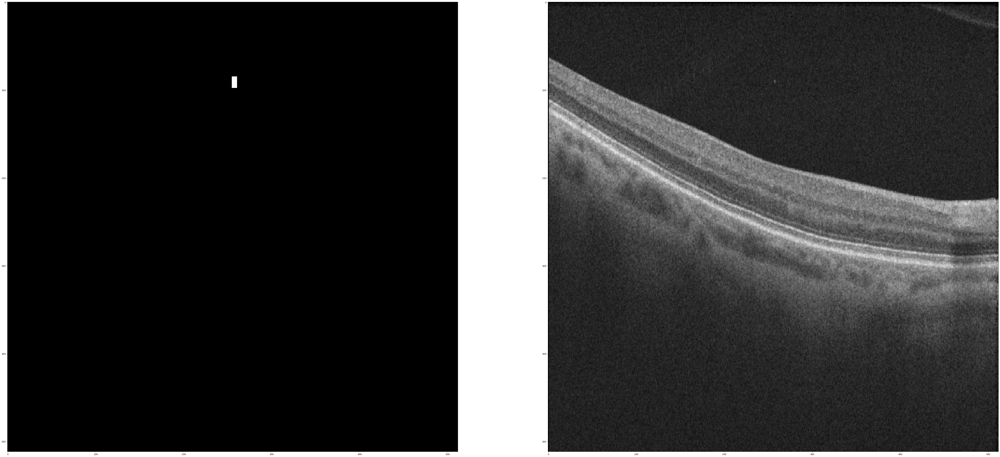

In [12]:
import torchvision.utils
from matplotlib import pyplot as plt
def reverse_transform(inp):
  inp = inp.numpy().transpose((1, 2, 0))
  # mean = np.array([0.485, 0.456, 0.406])
  # std = np.array([0.229, 0.224, 0.225])
  # inp = std * inp + mean
  # inp = np.clip(inp, 0, 1)
  inp = (inp * 255).astype(np.uint8)
  print(np.max(inp))
  return np.squeeze(inp)

# Get a batch of training data
inputs, masks = next(iter(dataloaders['train']))

print(reverse_transform(inputs[3]).shape, inputs.shape)
rows =1
columns =2
val_index = 2
fig = plt.figure(figsize=(80, 40))
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(masks[val_index]),cmap='gray', vmin=0, vmax=1)
fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(inputs[val_index][1,:,:]),cmap='gray', vmin=0, vmax=1)
# print(torch.max(inputs))
# print(torch.histc(masks))

# Define a UNet module

In [13]:
import torch.nn as nn
import torchvision.models


def convrelu(in_channels, out_channels, kernel, padding):
  return nn.Sequential(
    nn.Conv2d(in_channels, out_channels, kernel, padding=padding),
    nn.ReLU(inplace=True),
  )


class ResNetUNet(nn.Module):
  def __init__(self, n_class):
    super().__init__()

    self.base_model = torchvision.models.resnet18(pretrained=True)
    self.base_layers = list(self.base_model.children())

    self.layer0 = nn.Sequential(*self.base_layers[:3]) # size=(N, 64, x.H/2, x.W/2)
    self.layer0_1x1 = convrelu(64, 64, 1, 0)
    self.layer1 = nn.Sequential(*self.base_layers[3:5]) # size=(N, 64, x.H/4, x.W/4)
    self.layer1_1x1 = convrelu(64, 64, 1, 0)
    self.layer2 = self.base_layers[5]  # size=(N, 128, x.H/8, x.W/8)
    self.layer2_1x1 = convrelu(128, 128, 1, 0)
    self.layer3 = self.base_layers[6]  # size=(N, 256, x.H/16, x.W/16)
    self.layer3_1x1 = convrelu(256, 256, 1, 0)
    self.layer4 = self.base_layers[7]  # size=(N, 512, x.H/32, x.W/32)
    self.layer4_1x1 = convrelu(512, 512, 1, 0)

    self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    self.conv_up3 = convrelu(256 + 512, 512, 3, 1)
    self.conv_up2 = convrelu(128 + 512, 256, 3, 1)
    self.conv_up1 = convrelu(64 + 256, 256, 3, 1)
    self.conv_up0 = convrelu(64 + 256, 128, 3, 1)

    self.conv_original_size0 = convrelu(3, 64, 3, 1)
    self.conv_original_size1 = convrelu(64, 64, 3, 1)
    self.conv_original_size2 = convrelu(64 + 128, 64, 3, 1)

    self.conv_last = nn.Conv2d(64, n_class, 1)

  def forward(self, input):
    x_original = self.conv_original_size0(input)
    x_original = self.conv_original_size1(x_original)

    layer0 = self.layer0(input)
    layer1 = self.layer1(layer0)
    layer2 = self.layer2(layer1)
    layer3 = self.layer3(layer2)
    layer4 = self.layer4(layer3)

    layer4 = self.layer4_1x1(layer4)
    x = self.upsample(layer4)
    layer3 = self.layer3_1x1(layer3)
    x = torch.cat([x, layer3], dim=1)
    x = self.conv_up3(x)

    x = self.upsample(x)
    layer2 = self.layer2_1x1(layer2)
    x = torch.cat([x, layer2], dim=1)
    x = self.conv_up2(x)

    x = self.upsample(x)
    layer1 = self.layer1_1x1(layer1)
    x = torch.cat([x, layer1], dim=1)
    x = self.conv_up1(x)

    x = self.upsample(x)
    layer0 = self.layer0_1x1(layer0)
    x = torch.cat([x, layer0], dim=1)
    x = self.conv_up0(x)

    x = self.upsample(x)
    x = torch.cat([x, x_original], dim=1)
    x = self.conv_original_size2(x)

    out = self.conv_last(x)

    return out

## Instantiate the UNet model

- Move the model to GPU if available
- Show model summaries

In [14]:
import torch
import torch.nn as nn
import pytorch_unet

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device', device)

model = ResNetUNet(1)
model = model.to(device)
torch.set_num_threads(20)

device cuda


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 255MB/s]


In [15]:
model

ResNetUNet(
  (base_model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [16]:
from torchsummary import summary
summary(model, input_size=(3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           1,792
              ReLU-2         [-1, 64, 512, 512]               0
            Conv2d-3         [-1, 64, 512, 512]          36,928
              ReLU-4         [-1, 64, 512, 512]               0
            Conv2d-5         [-1, 64, 256, 256]           9,408
            Conv2d-6         [-1, 64, 256, 256]           9,408
       BatchNorm2d-7         [-1, 64, 256, 256]             128
       BatchNorm2d-8         [-1, 64, 256, 256]             128
              ReLU-9         [-1, 64, 256, 256]               0
             ReLU-10         [-1, 64, 256, 256]               0
        MaxPool2d-11         [-1, 64, 128, 128]               0
        MaxPool2d-12         [-1, 64, 128, 128]               0
           Conv2d-13         [-1, 64, 128, 128]          36,864
           Conv2d-14         [-1, 64, 1

# Define the main training loop

In [17]:
from collections import defaultdict
import torch.nn.functional as F
from loss import dice_loss

checkpoint_path = "checkpoint_bce_81_bce01.pth"

def calc_loss(pred, target, metrics, bce_weight=0.5):
    bce = F.binary_cross_entropy_with_logits(pred, target)

    pred = torch.sigmoid(pred)
    dice = dice_loss(pred, target)

    loss = bce * bce_weight + dice * (1 - bce_weight)

    metrics['bce'] += bce.data.cpu().numpy() * target.size(0)
    metrics['dice loss'] += dice.data.cpu().numpy() * target.size(0)
    metrics['loss'] += loss.data.cpu().numpy() * target.size(0)

    return loss

def print_metrics(metrics, epoch_samples, phase):
    outputs = []
    for k in metrics.keys():
        outputs.append("{}: {:4f}".format(k, metrics[k] / epoch_samples))

    print("{}: {}".format(phase, ", ".join(outputs)))

def train_model(model, optimizer, scheduler, num_epochs=25):
    best_loss = 1e10
    best_epoch = -1
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        since = time.time()

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            metrics = defaultdict(float)
            epoch_samples = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = calc_loss(outputs, labels, metrics, bce_weight=0.1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        scheduler.step()
#                         print("LR",optimizer.param_groups[-1]['lr'])
                # statistics
                epoch_samples += inputs.size(0)

            print_metrics(metrics, epoch_samples, phase)
            epoch_loss = metrics['loss'] / epoch_samples

            if phase == 'train':

              for param_group in optimizer.param_groups:
                  print("LR", param_group['lr'])

            # save the model weights
            if phase == 'val' and epoch_loss < best_loss:
                print(f"saving best model to {checkpoint_path}")
                best_loss = epoch_loss
                best_epoch = epoch
                torch.save(model.state_dict(), checkpoint_path)

        time_elapsed = time.time() - since
        print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

    print('Best val loss: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(torch.load(checkpoint_path))
    return model

## Training

In [18]:
import torch
import torch.optim as optim
from torch.optim import lr_scheduler
import time
from cosine_annealing_warmup import CosineAnnealingWarmupRestarts

num_class = 1
model = ResNetUNet(num_class).to(device)

# freeze backbone layers
for l in model.base_layers:
  for param in l.parameters():
    param.requires_grad = False

optimizer_ft = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=3e-4)
# optimizer_ft = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, momentum=0.9,weight_decay = 0.0005)
scheduler = CosineAnnealingWarmupRestarts(optimizer_ft,
                                          first_cycle_steps=200,
                                          cycle_mult=1.0,
                                          max_lr=0.001,
                                          min_lr=0.00001,
                                          warmup_steps=10,
                                          gamma=1.0)
# exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=8, gamma=0.1)

model = train_model(model, optimizer_ft, scheduler, num_epochs=300)

Epoch 0/299
----------
train: bce: 0.479859, dice loss: 0.995760, loss: 0.944170
LR 0.0007030000000000001
val: bce: 0.148074, dice loss: 0.995590, loss: 0.910838
saving best model to checkpoint_bce_81_bce01.pth
0m 3s
Epoch 1/299
----------
train: bce: 0.221735, dice loss: 0.995084, loss: 0.917749
LR 0.0009989177454732933
val: bce: 0.087090, dice loss: 0.993948, loss: 0.903262
saving best model to checkpoint_bce_81_bce01.pth
0m 3s
Epoch 2/299
----------
train: bce: 0.037809, dice loss: 0.995593, loss: 0.899815
LR 0.0009918350120618293
val: bce: 0.031519, dice loss: 0.996510, loss: 0.900011
saving best model to checkpoint_bce_81_bce01.pth
0m 3s
Epoch 3/299
----------
train: bce: 0.021103, dice loss: 0.995516, loss: 0.898075
LR 0.000978237711859507
val: bce: 0.051149, dice loss: 0.995719, loss: 0.901262
0m 2s
Epoch 4/299
----------
train: bce: 0.028195, dice loss: 0.994704, loss: 0.898053
LR 0.0009583077966942535
val: bce: 0.040077, dice loss: 0.995817, loss: 0.900243
0m 2s
Epoch 5/299
--

## Predict new images using the trained model

In [21]:
# save the model to file
torch.save(model.state_dict(), "/content/model_08_24_2023.pth")

In [22]:
import math
device = 'cpu'
model.eval()   # Set model to the evaluation mode

# Create a new simulation dataset for testing
# test_dataset = SimDataset(3, transform = trans)
# test_loader = DataLoader(test_dataset, batch_size=3, shuffle=False, num_workers=0)
# Val batch size is the length of validation set
batch_size = len(test_image_paths)
print(batch_size)
dataloaders = {
  'val': torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=1)
}

# Get the first batch
inputs, masks =  next(iter(dataloaders['val']))
inputs = inputs.to(device)
labels = masks.to(device)
model = model.to(device)
print('inputs.shape', inputs[1].shape)
print('labels.shape', labels.shape)

# Predict
pred = model(inputs)
# The loss functions include the sigmoid function.
pred = torch.sigmoid(pred)
pred = pred.data.cpu().numpy()
inputs = inputs.data.cpu().numpy()
print('pred.shape', pred.shape)
print('pred.max', np.max(pred))
# rows =1
# columns =3

# for i in range(batch_size):
#     fig = plt.figure(figsize=(80, 40))
#     val_index = i
#     fig.add_subplot(rows, columns, 1)
#     plt.title('Prediction',fontsize=60)
#     plt.imshow(np.squeeze(pred[val_index]),cmap='gray', vmin=0, vmax=1)
#     fig.add_subplot(rows, columns, 2)
#     plt.title('Image',fontsize=60)
#     plt.imshow(np.squeeze(inputs[val_index][0,:,:]),cmap='gray', vmin=0, vmax=1)
#     fig.add_subplot(rows, columns, 3)
#     plt.title('Ground-Truth',fontsize=60)
#     plt.imshow(np.squeeze(masks[val_index]),cmap='gray', vmin=0, vmax=1)


22
inputs.shape torch.Size([3, 512, 512])
labels.shape torch.Size([22, 1, 512, 512])
pred.shape (22, 1, 512, 512)
pred.max 1.0


In [28]:
save_dir = '/content/Predicted_Images'
os.makedirs(save_dir, exist_ok=True)


In [52]:
uint8_array=(pred[0] * 255).astype(np.uint8)
uint8_array

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint8)

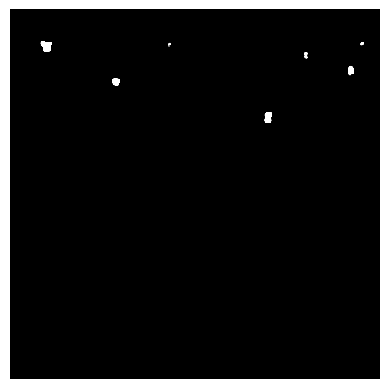

In [54]:
plt.imshow(np.squeeze(uint8_array), cmap='gray', vmin=0, vmax=1)
plt.axis('off')
plt.show()

In [ ]:
plt.imshow(npsqeeze(test_mask_path))

saving prediction image /content/Predicted_Images/966 OD-1.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/966 OD-1.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


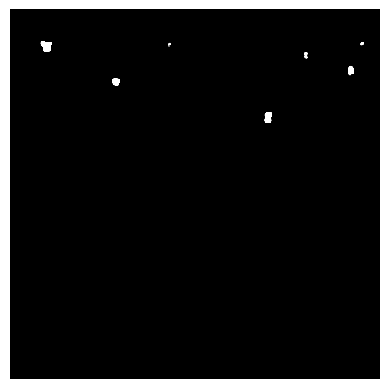

saving prediction image /content/Predicted_Images/690 OS-1.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/690 OS-1.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


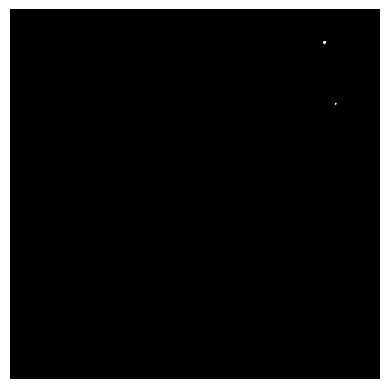

saving prediction image /content/Predicted_Images/694 OS-4.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/694 OS-4.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


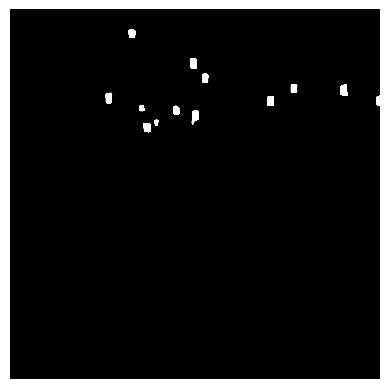

saving prediction image /content/Predicted_Images/261 OD-2.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/261 OD-2.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


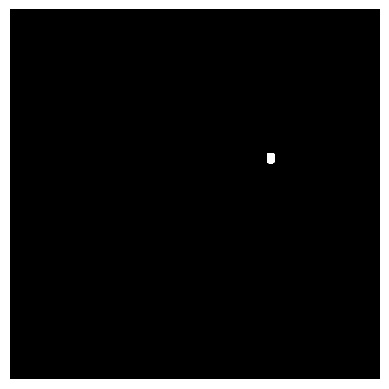

saving prediction image /content/Predicted_Images/934 OD-3.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/934 OD-3.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


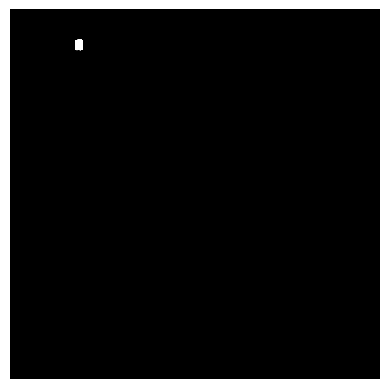

saving prediction image /content/Predicted_Images/357 OD-1.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/357 OD-1.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


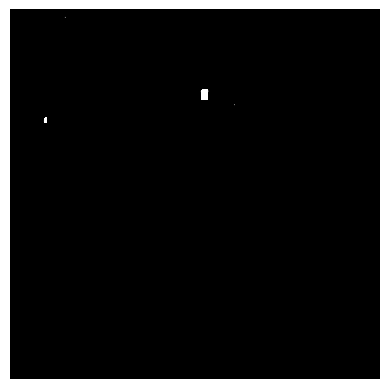

saving prediction image /content/Predicted_Images/996 OS-3.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/996 OS-3.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


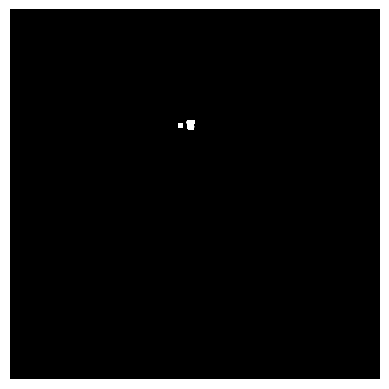

saving prediction image /content/Predicted_Images/275 OD-5.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/275 OD-5.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


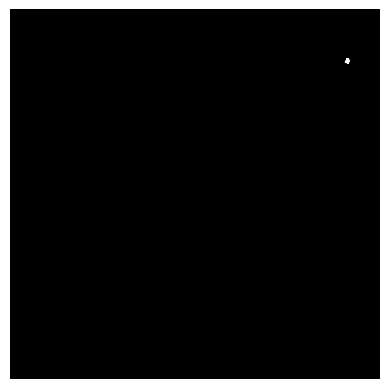

saving prediction image /content/Predicted_Images/480 OD-1.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/480 OD-1.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


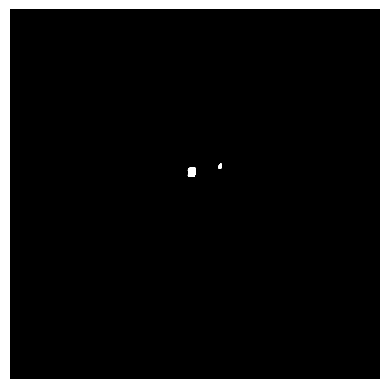

saving prediction image /content/Predicted_Images/694 OS-2.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/694 OS-2.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


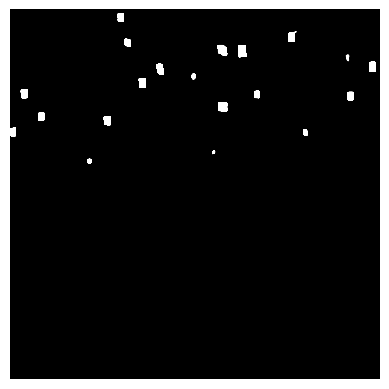

saving prediction image /content/Predicted_Images/152 OD-2.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/152 OD-2.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


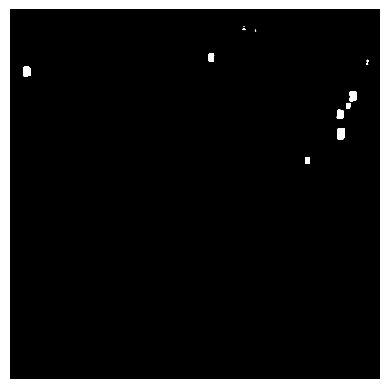

saving prediction image /content/Predicted_Images/966 OD-2.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/966 OD-2.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


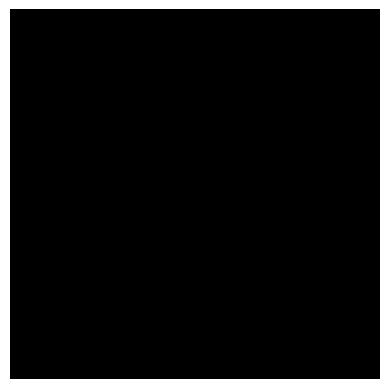

saving prediction image /content/Predicted_Images/152 OD-3.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/152 OD-3.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


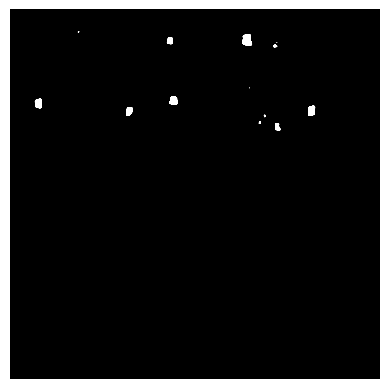

saving prediction image /content/Predicted_Images/24 OS-1.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/24 OS-1.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


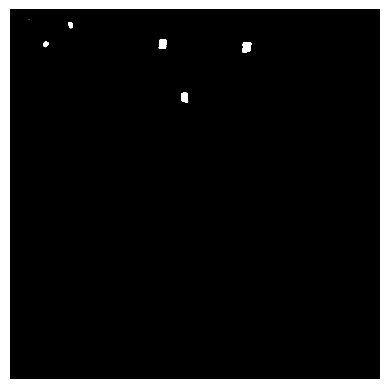

saving prediction image /content/Predicted_Images/694 OS-5.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/694 OS-5.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


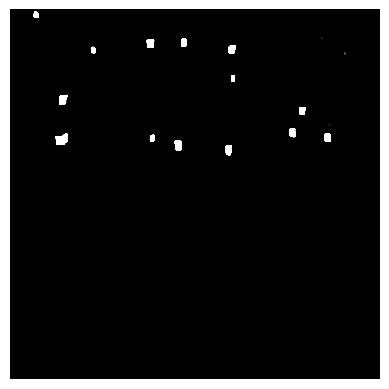

saving prediction image /content/Predicted_Images/2 OS-1.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/2 OS-1.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


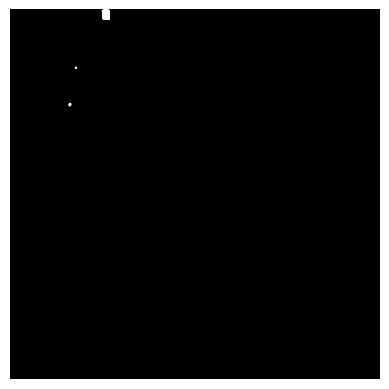

saving prediction image /content/Predicted_Images/480 OD-5.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/480 OD-5.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


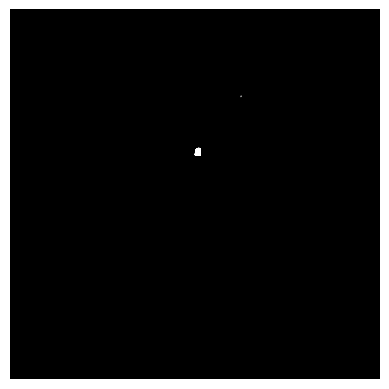

saving prediction image /content/Predicted_Images/152 OD-5.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/152 OD-5.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


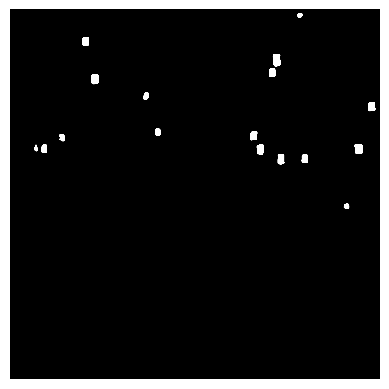

saving prediction image /content/Predicted_Images/694 OS-3.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/694 OS-3.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


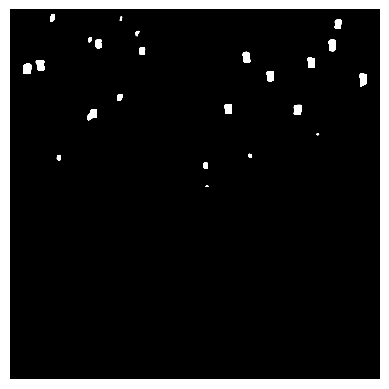

saving prediction image /content/Predicted_Images/152 OD-4.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/152 OD-4.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


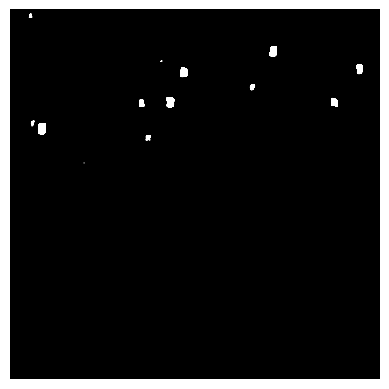

saving prediction image /content/Predicted_Images/357 OD-3.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/357 OD-3.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


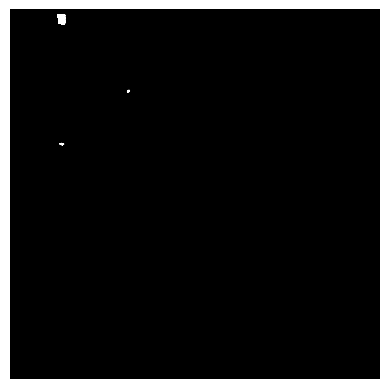

saving prediction image /content/Predicted_Images/357 OD-4.png


<ipython-input-55-63e61c211843>:7: UserWarning: /content/Predicted_Images/357 OD-4.png is a low contrast image
  io.imsave(output_path, prediction_image, cmap='gray')


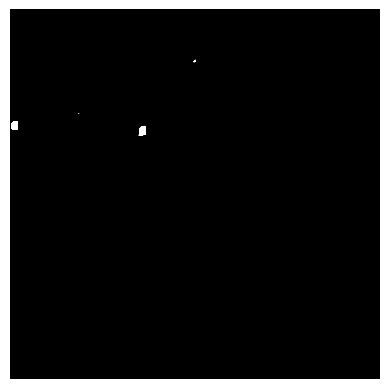

In [55]:
from skimage import io
for i in range(pred.shape[0]):
  prediction_image = (pred[i] * 255).astype(np.uint8)
  prediction_image = np.squeeze(prediction_image)
  output_path = test_image_paths[i].replace("Original_Images", "Predicted_Images")
  print(f'saving prediction image {output_path}')
  io.imsave(output_path, prediction_image, cmap='gray')

  plt.imshow(prediction_image, cmap='gray', vmin=0, vmax=1)
  plt.axis('off')
  plt.show()

In [59]:
! cp /content/Predicted_Images/*.png "/content/drive/.shortcut-targets-by-id/1Gd6Qvx67HvZr5HE48UMhRc2vhUfBl1Jh/PVO_Segmentation_Project/Processed_Images/aug24"

In [63]:
# save the model so we can reload model
! cp /content/model_08_24_2023.pth "/content/drive/.shortcut-targets-by-id/1Gd6Qvx67HvZr5HE48UMhRc2vhUfBl1Jh/PVO_Segmentation_Project/Processed_Images/"

In [60]:
# import math
# device = 'cpu'
# model.eval()   # Set model to the evaluation mode

# # Create a new simulation dataset for testing
# # test_dataset = SimDataset(3, transform = trans)
# # test_loader = DataLoader(test_dataset, batch_size=3, shuffle=False, num_workers=0)
# # Val batch size is the length of validation set
# batch_size = len(test_image_paths)
# print(batch_size)
# dataloaders = {

#   'val': torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=1)
# }
# # Get the first batch
# inputs, masks =  next(iter(dataloaders['val']))
# inputs = inputs.to(device)
# labels = masks.to(device)
# model = model.to(device)
# print('inputs.shape', inputs[1].shape)
# print('labels.shape', labels.shape)

# # Predict
# pred = model(inputs)
# # The loss functions include the sigmoid function.
# pred = torch.sigmoid(pred)
# pred = pred.data.cpu().numpy()
# inputs = inputs.data.cpu().numpy()
# print('pred.shape', pred.shape)
# print('pred.max', np.max(pred))
rows =1
columns =3

import os
save_dir = '/content/output_images'
os.makedirs(save_dir, exist_ok=True)

for i in range(batch_size):
    val_index = i
    fig = plt.figure(figsize=(80, 40))

    # Subplot 1: Prediction
    plt.subplot(1, 3, 1)
    plt.title('Prediction', fontsize=60)
    plt.imshow(np.squeeze(pred[val_index]), cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    filename_pred = f'prediction_{i}.png'
    file_path_pred = os.path.join(save_dir, filename_pred)
    plt.savefig(file_path_pred, bbox_inches='tight', pad_inches=0)
    plt.clf()  # Clear the figure

    # Subplot 2: Input Image
    plt.subplot(1, 3, 2)
    plt.title('Image', fontsize=60)
    plt.imshow(np.squeeze(inputs[val_index][0, :, :]), cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    filename_input = f'image_{i}.png'
    file_path_input = os.path.join(save_dir, filename_input)
    plt.savefig(file_path_input, bbox_inches='tight', pad_inches=0)
    plt.clf()  # Clear the figure

    # Subplot 3: Ground Truth
    plt.subplot(1, 3, 3)
    plt.title('Ground-Truth', fontsize=60)
    plt.imshow(np.squeeze(masks[val_index]), cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    filename_gt = f'ground_truth_{i}.png'
    file_path_gt = os.path.join(save_dir, filename_gt)
    plt.savefig(file_path_gt, bbox_inches='tight', pad_inches=0)
    plt.clf()  # Clear the figure

    plt.close(fig)  # Close the main figure

<ipython-input-61-f542492cc332>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(80, 40))


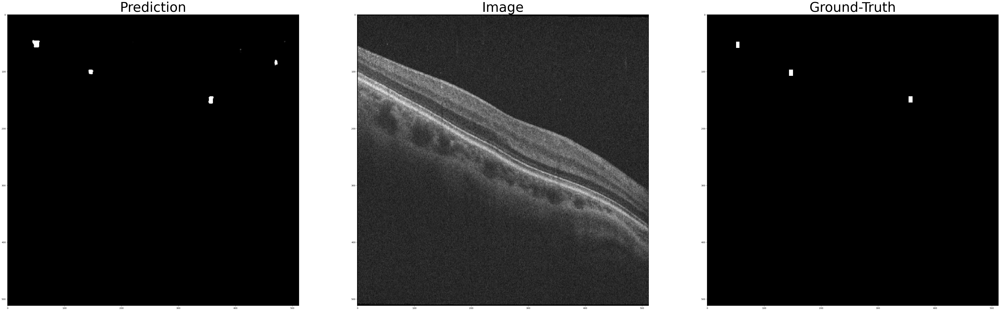

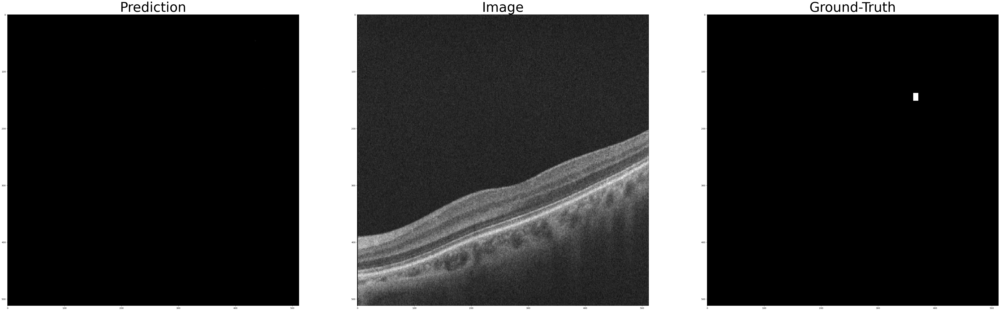

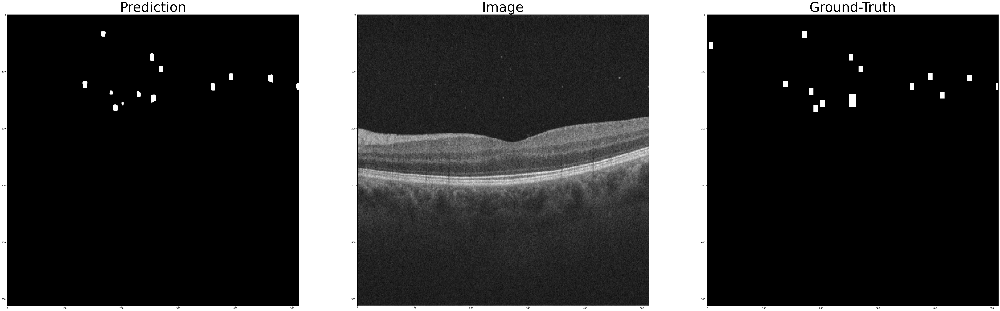

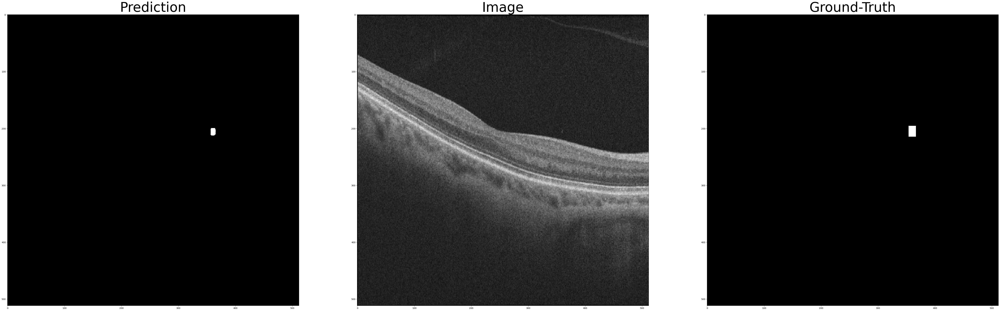

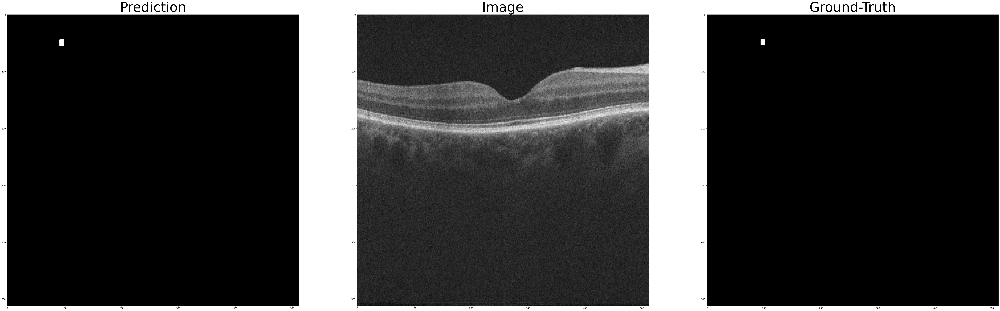

...

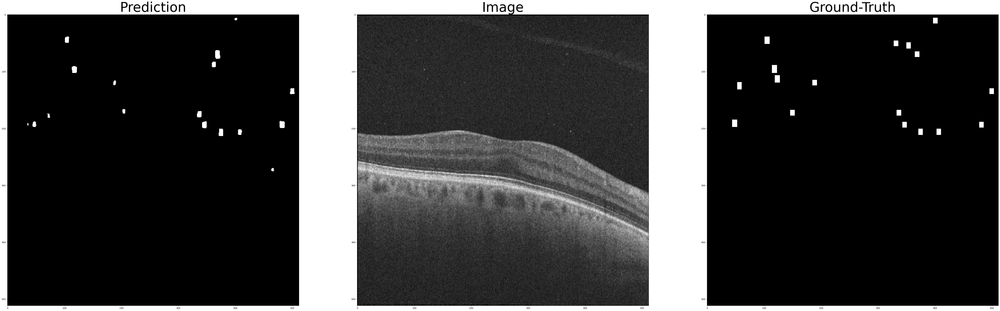

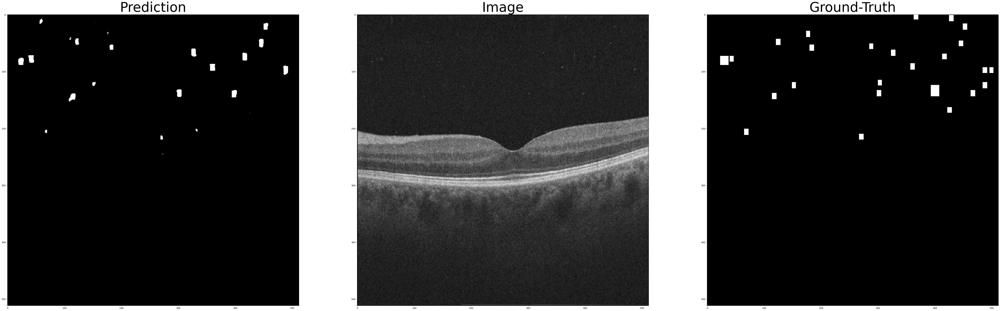

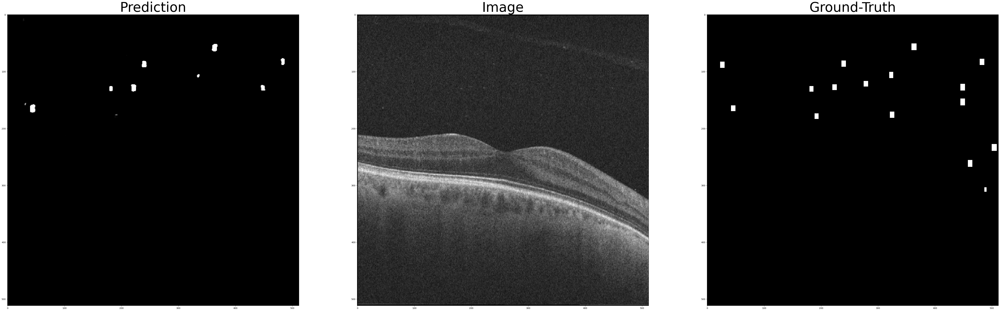

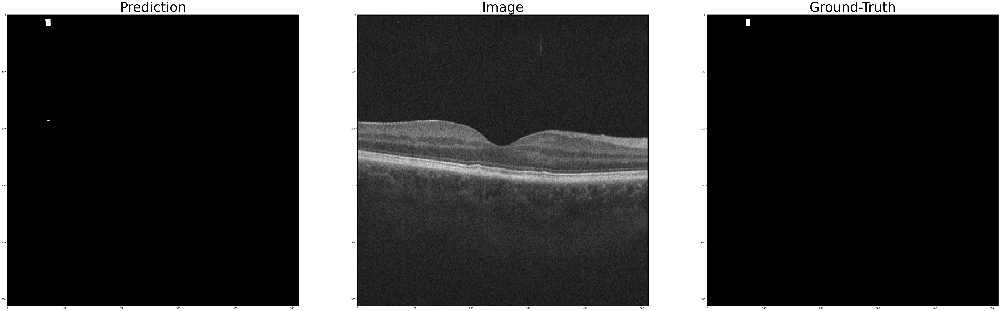

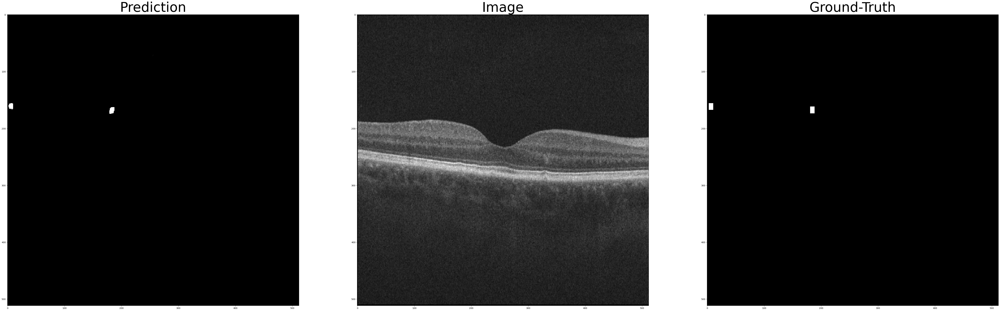

In [61]:
rows =1
columns =3

for i in range(batch_size):
    fig = plt.figure(figsize=(80, 40))
    val_index = i
    fig.add_subplot(rows, columns, 1)
    plt.title('Prediction',fontsize=60)
    plt.imshow(np.squeeze(pred[val_index]),cmap='gray', vmin=0, vmax=1)
    fig.add_subplot(rows, columns, 2)
    plt.title('Image',fontsize=60)
    plt.imshow(np.squeeze(inputs[val_index][0,:,:]),cmap='gray', vmin=0, vmax=1)
    fig.add_subplot(rows, columns, 3)
    plt.title('Ground-Truth',fontsize=60)
    plt.imshow(np.squeeze(masks[val_index]),cmap='gray', vmin=0, vmax=1)


In [67]:
!pip install cvlib
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import glob
import os
import cv2
import cvlib as cv
from cvlib.object_detection import draw_bbox
from matplotlib import pyplot as plt
# %matplotlib inline

# import matplotlib.pyplot as pl
# image = data.hubble_deep_field()[0:500, 0:500]
def count_box(image_path):
#     image_path = '/home/mingyang/PVO/BB_Annotated_Masked_Gray_Downsampled/BB_Annotated_Masked_Gray_Downsampled_ALL/'
    file = '*.png'
    for file in glob.glob(os.path.join(image_path, file)):
        image = cv2.imread(os.path.join(image_path, file), cv2.IMREAD_GRAYSCALE)
    #     print(image.shape)
        img1 = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10,10))
        plt.axis('off')
        plt.imshow(img1)
        plt.show()
        image_gray = image
        blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)

        # Compute radii in the 3rd column.
        blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

        blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
        blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

        blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

        blobs_list = [blobs_log, blobs_dog, blobs_doh]
        colors = ['yellow', 'lime', 'red']
        titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
                  'Determinant of Hessian']
        sequence = zip(blobs_list, colors, titles)
        print(f'\n\nfile: {file}, number of boxes:')
        #print(f'\tLaplacian of Gaussian={len(blobs_list[0])}')
        #print(f'\tDifference of Gaussian={len(blobs_list[1])}')
        print(f'\tDeterminant of Hessian={len(blobs_list[2])}\n\n')
        #, Number of boxes: {len(blobs_list[2])}')
#   Visulize the boxes
#         fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
#         ax = axes.ravel()

#   Visulize the boxes
#     for idx, (blobs, color, title) in enumerate(sequence):
#         ax[idx].set_title(title)
#         print(title)
#         ax[idx].imshow(image)
#         for blob in blobs:
#             y, x, r = blob
#             c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
#             ax[idx].add_patch(c)
#         ax[idx].set_axis_off()

#         plt.tight_layout()
#         plt.show()
    return blobs_list
# print('There are boxes',len(blobs_list[2]))

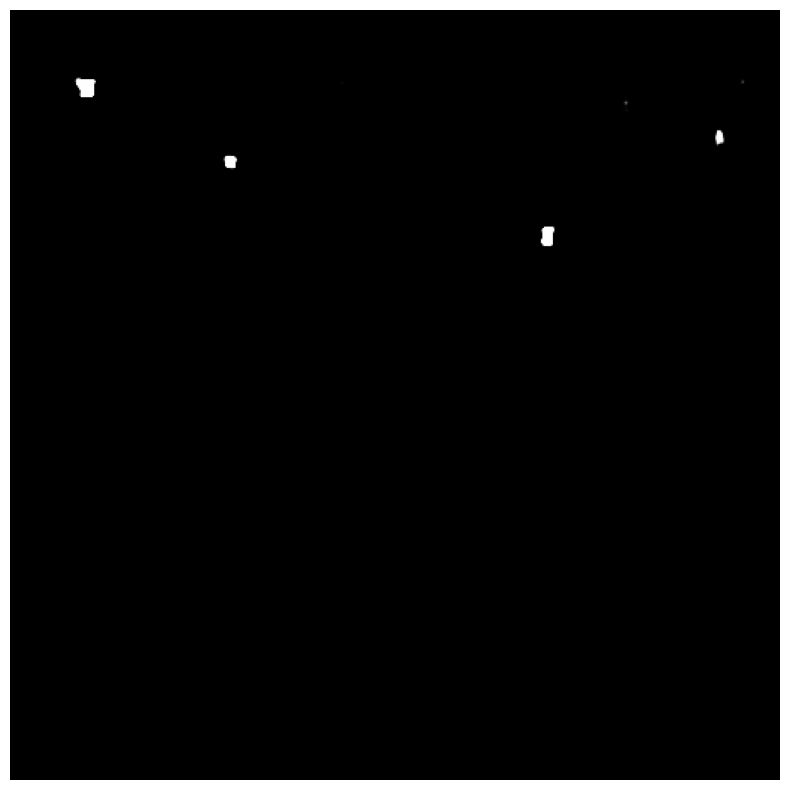



file: /content/Predicted_Images/966 OD-1.png, number of boxes:
	Determinant of Hessian=4




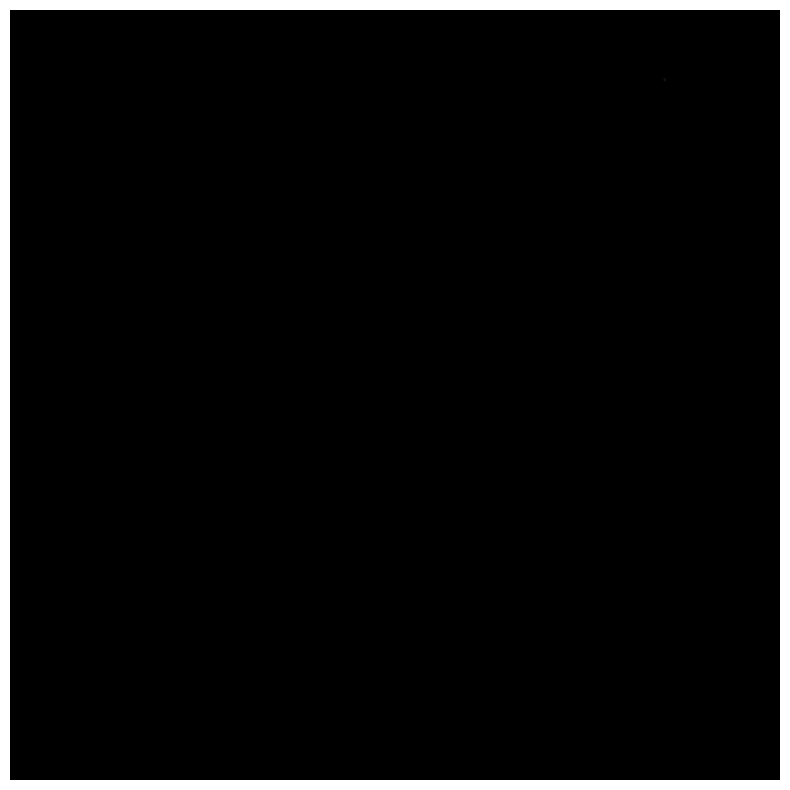



file: /content/Predicted_Images/690 OS-1.png, number of boxes:
	Determinant of Hessian=0




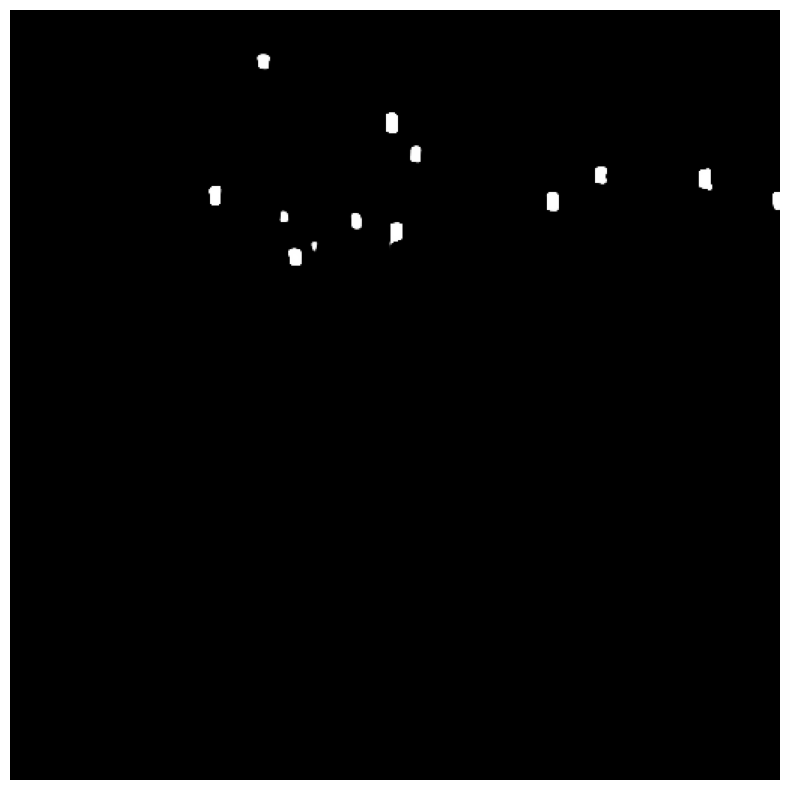



file: /content/Predicted_Images/694 OS-4.png, number of boxes:
	Determinant of Hessian=13




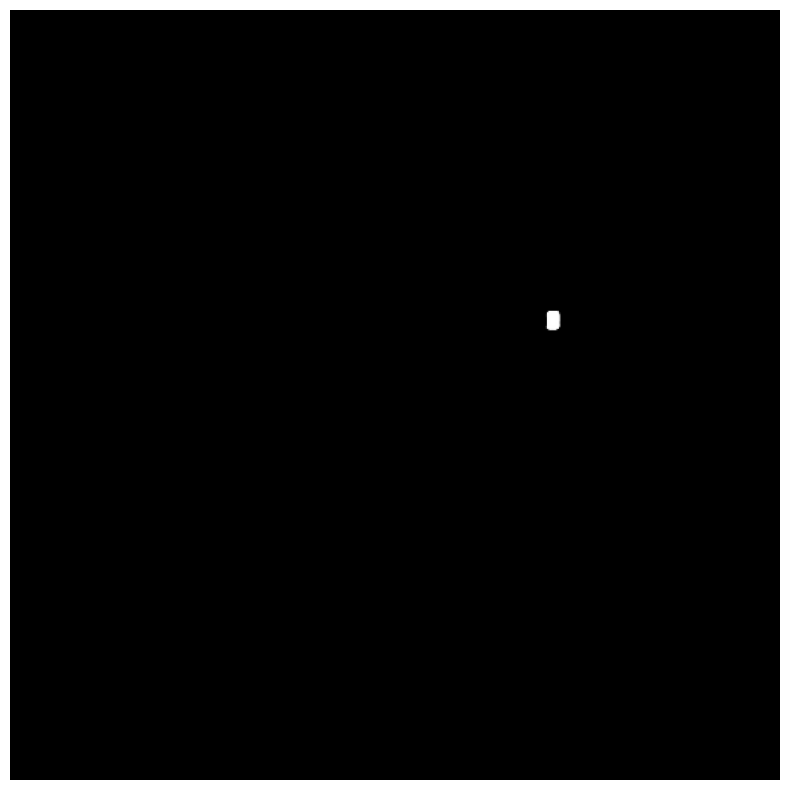



file: /content/Predicted_Images/261 OD-2.png, number of boxes:
	Determinant of Hessian=1




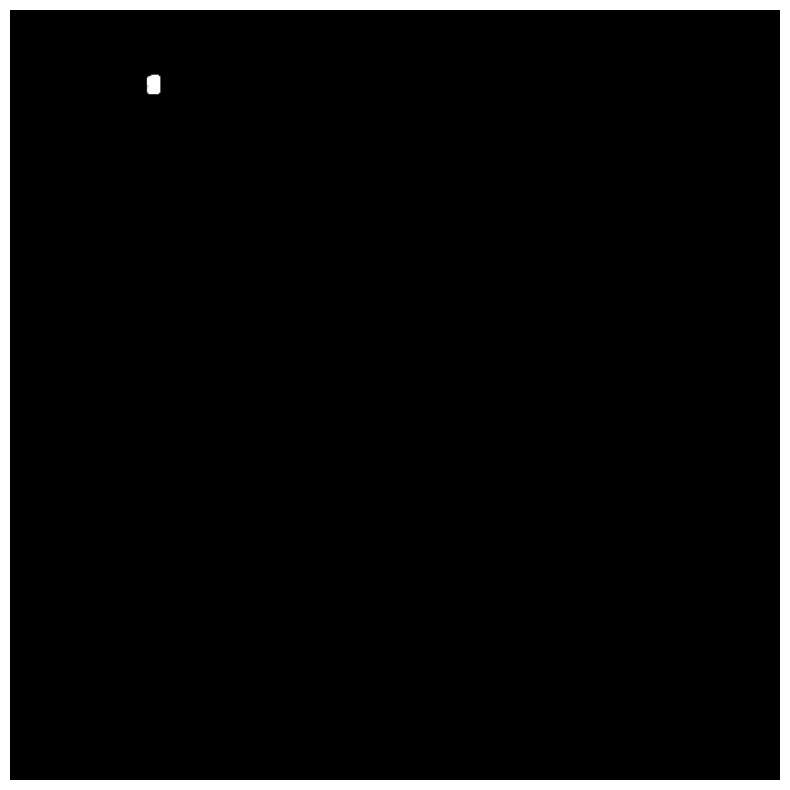



file: /content/Predicted_Images/934 OD-3.png, number of boxes:
	Determinant of Hessian=1




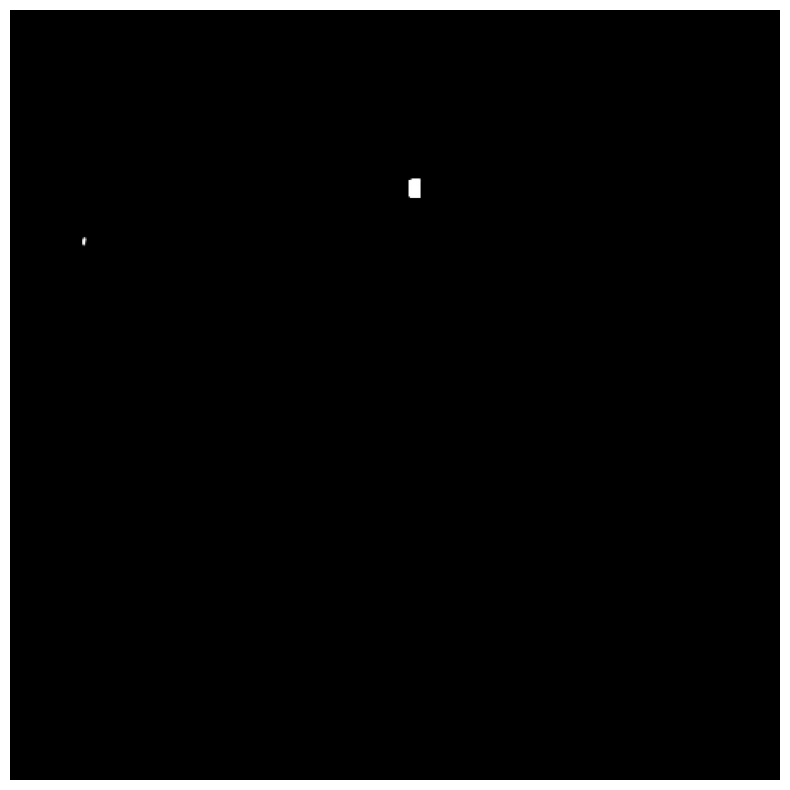



file: /content/Predicted_Images/357 OD-1.png, number of boxes:
	Determinant of Hessian=2




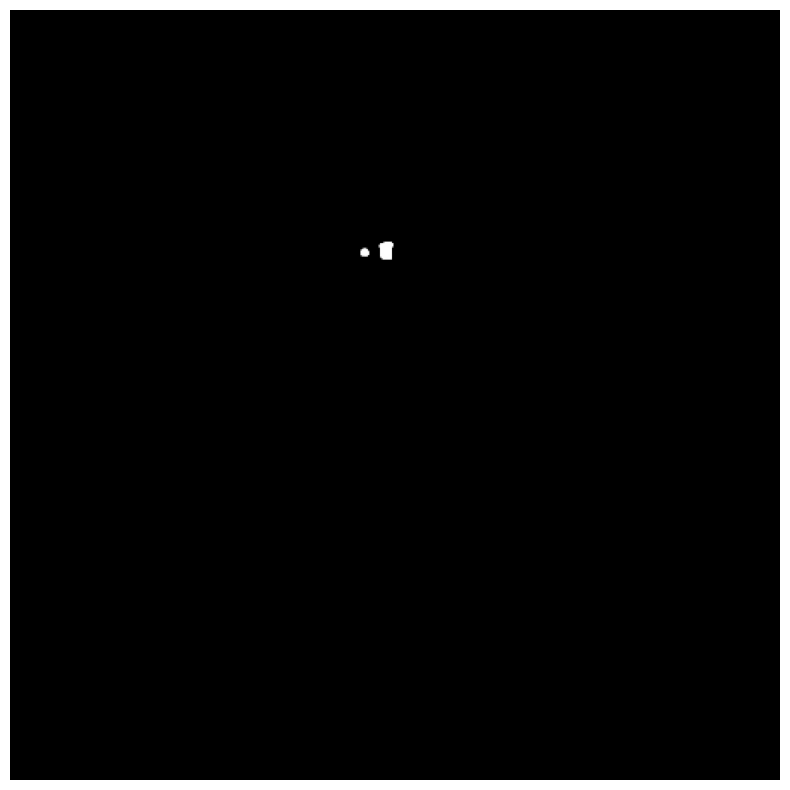



file: /content/Predicted_Images/996 OS-3.png, number of boxes:
	Determinant of Hessian=2




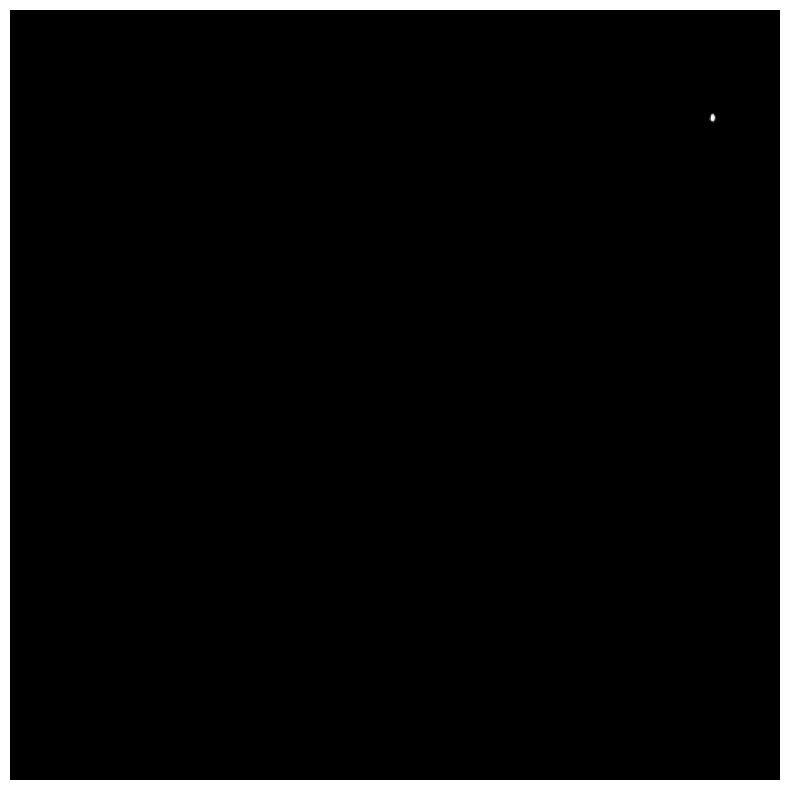



file: /content/Predicted_Images/275 OD-5.png, number of boxes:
	Determinant of Hessian=1




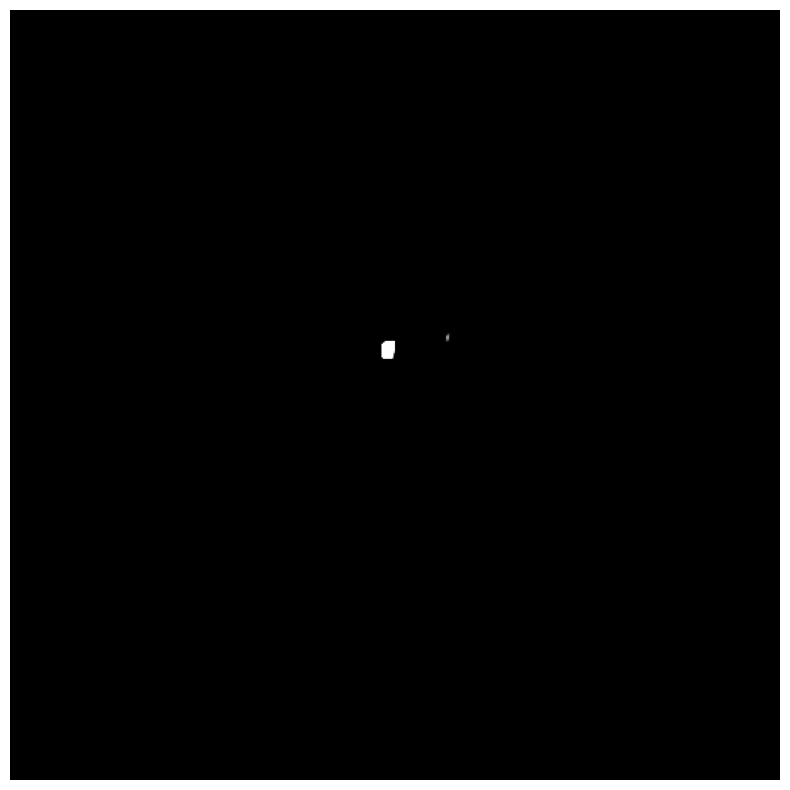



file: /content/Predicted_Images/480 OD-1.png, number of boxes:
	Determinant of Hessian=1




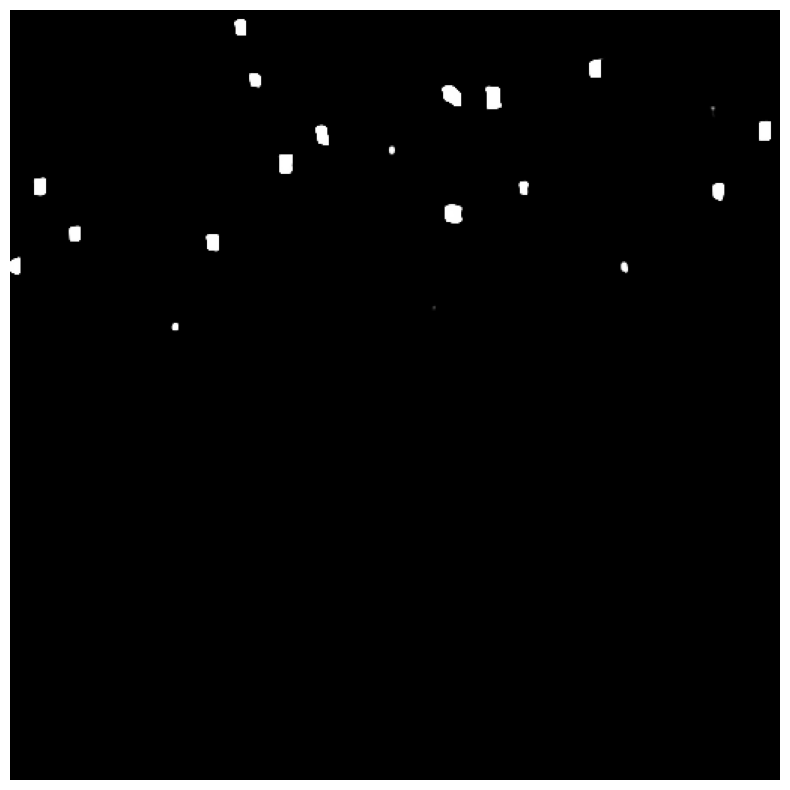



file: /content/Predicted_Images/694 OS-2.png, number of boxes:
	Determinant of Hessian=18




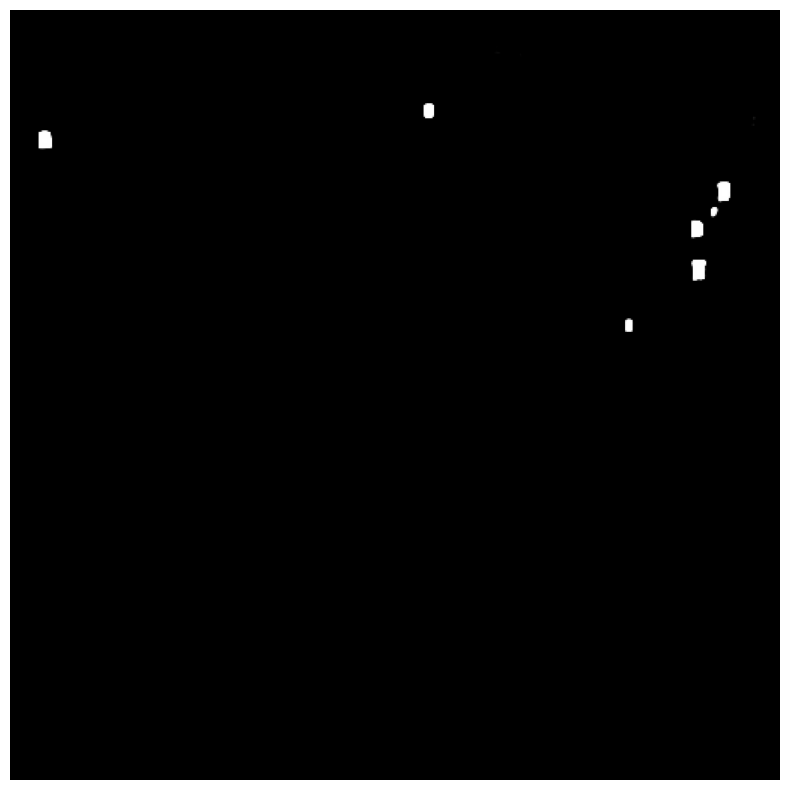



file: /content/Predicted_Images/152 OD-2.png, number of boxes:
	Determinant of Hessian=7




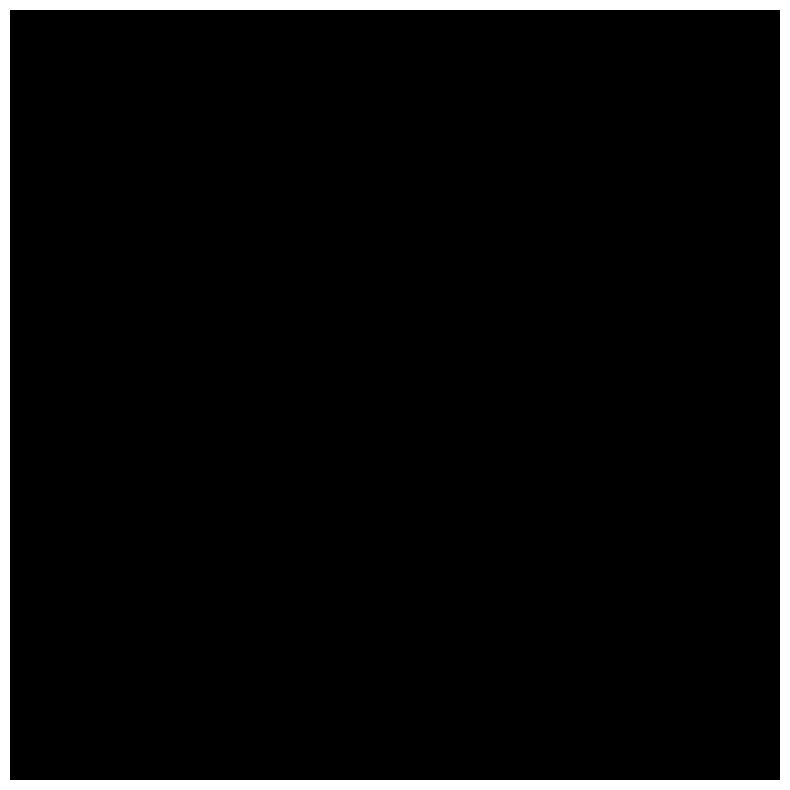



file: /content/Predicted_Images/966 OD-2.png, number of boxes:
	Determinant of Hessian=0




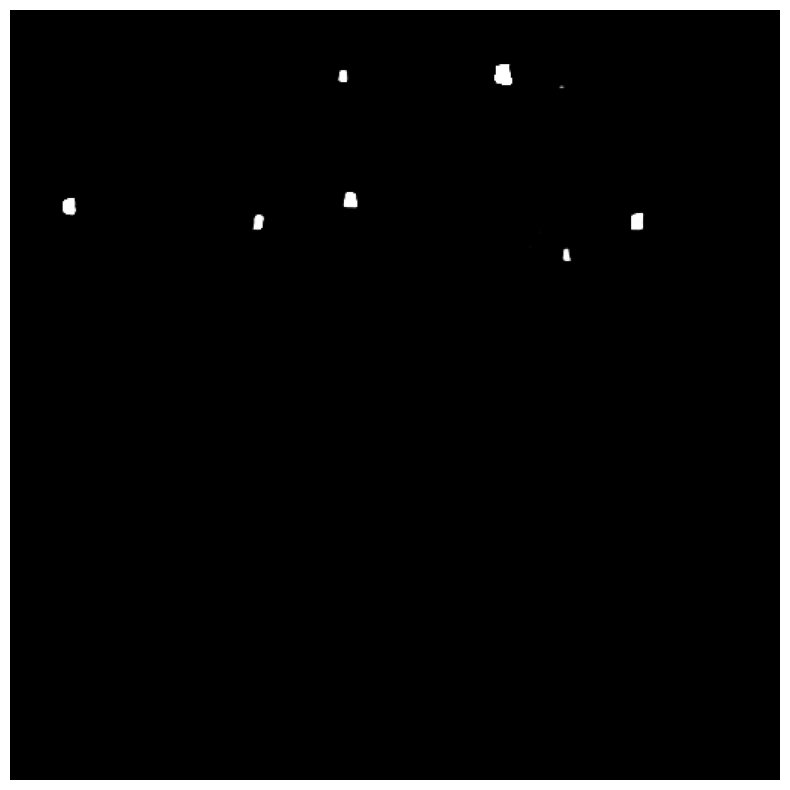



file: /content/Predicted_Images/152 OD-3.png, number of boxes:
	Determinant of Hessian=7




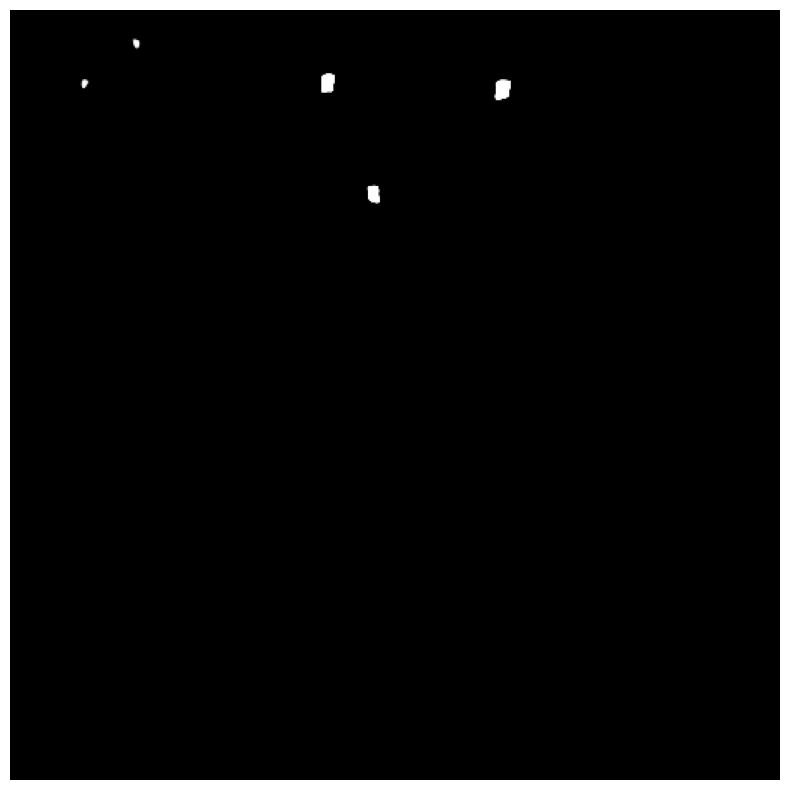



file: /content/Predicted_Images/24 OS-1.png, number of boxes:
	Determinant of Hessian=5




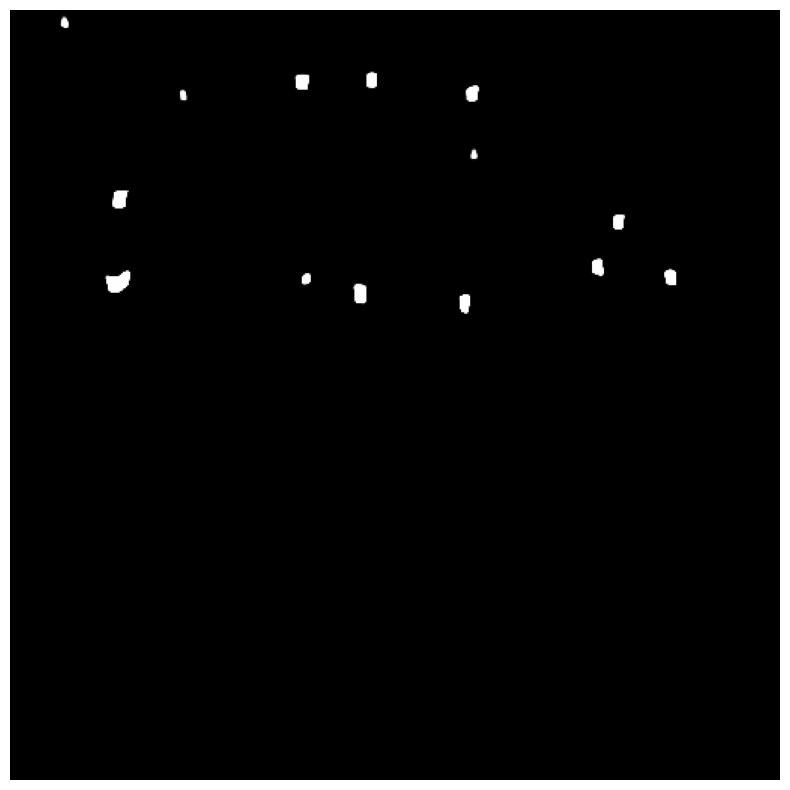



file: /content/Predicted_Images/694 OS-5.png, number of boxes:
	Determinant of Hessian=14




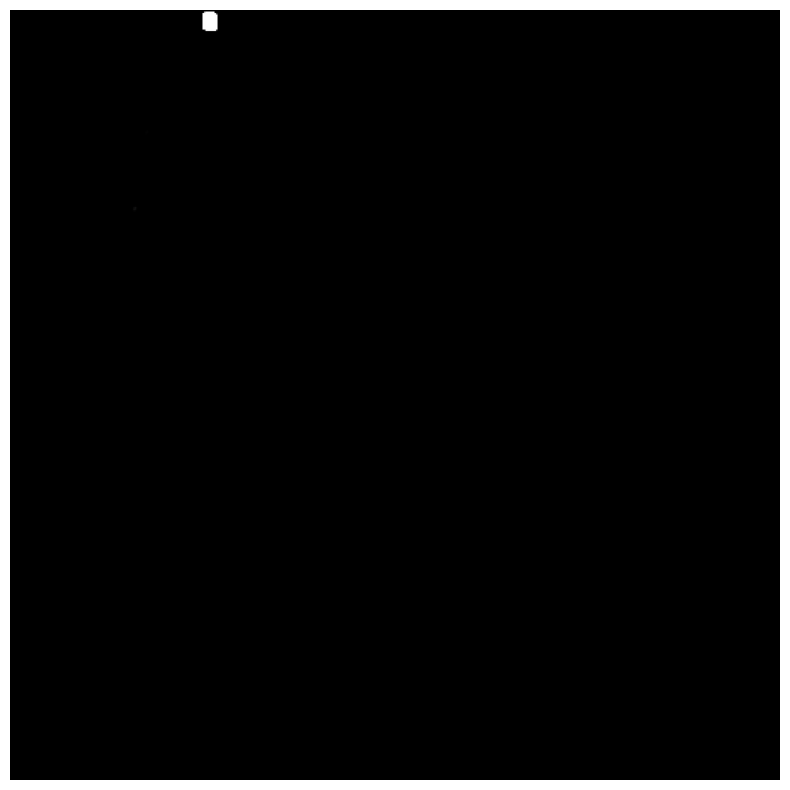



file: /content/Predicted_Images/2 OS-1.png, number of boxes:
	Determinant of Hessian=1




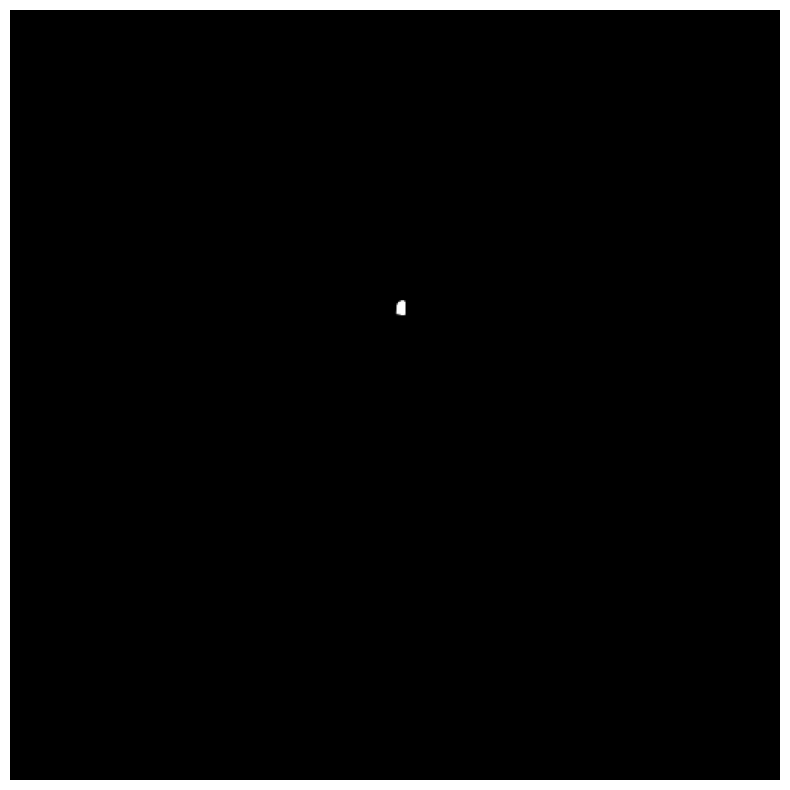



file: /content/Predicted_Images/480 OD-5.png, number of boxes:
	Determinant of Hessian=1




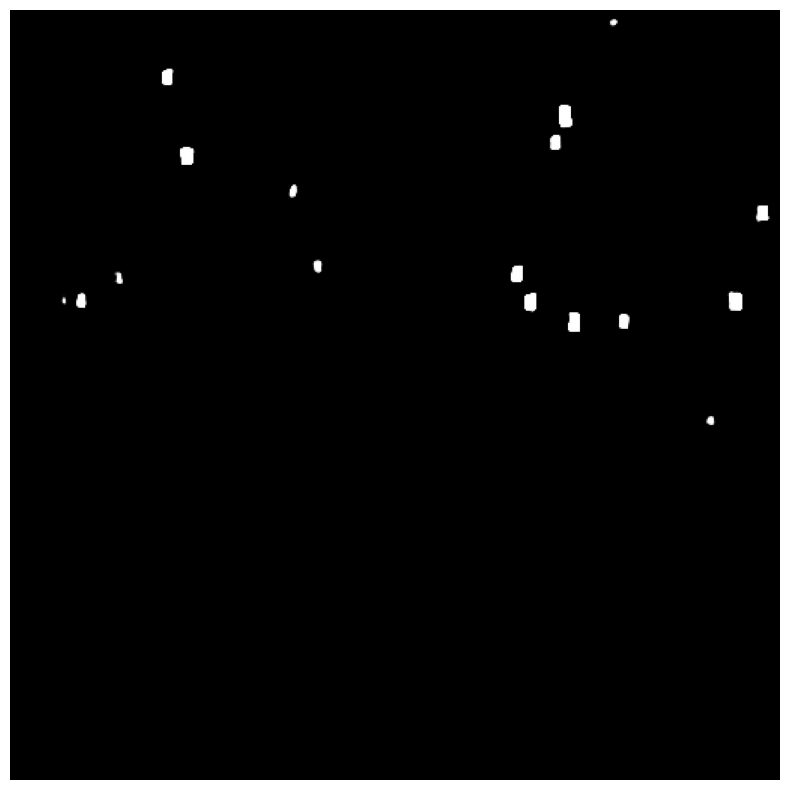



file: /content/Predicted_Images/152 OD-5.png, number of boxes:
	Determinant of Hessian=17




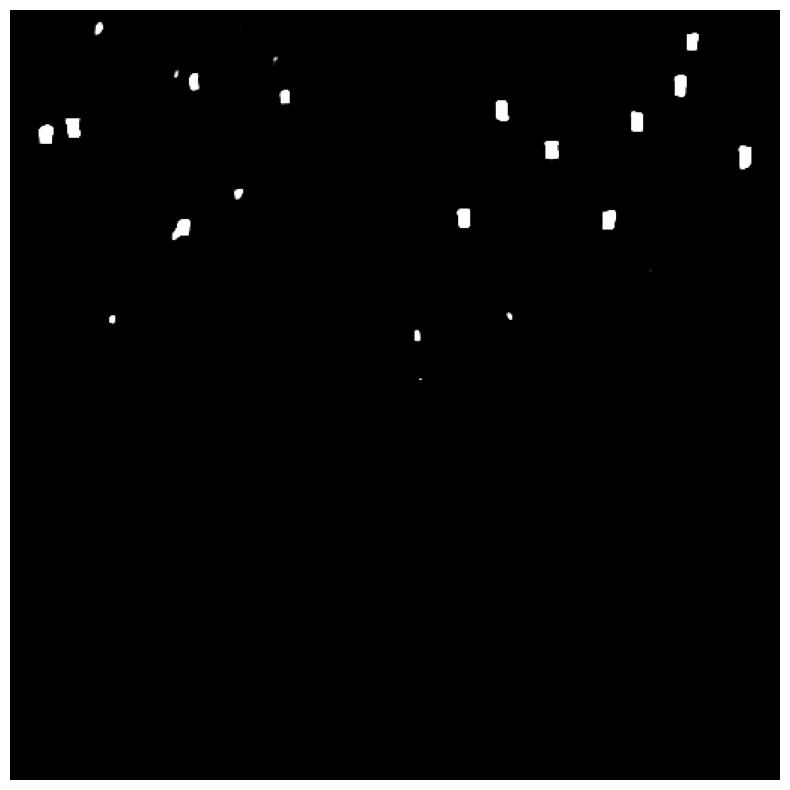



file: /content/Predicted_Images/694 OS-3.png, number of boxes:
	Determinant of Hessian=20




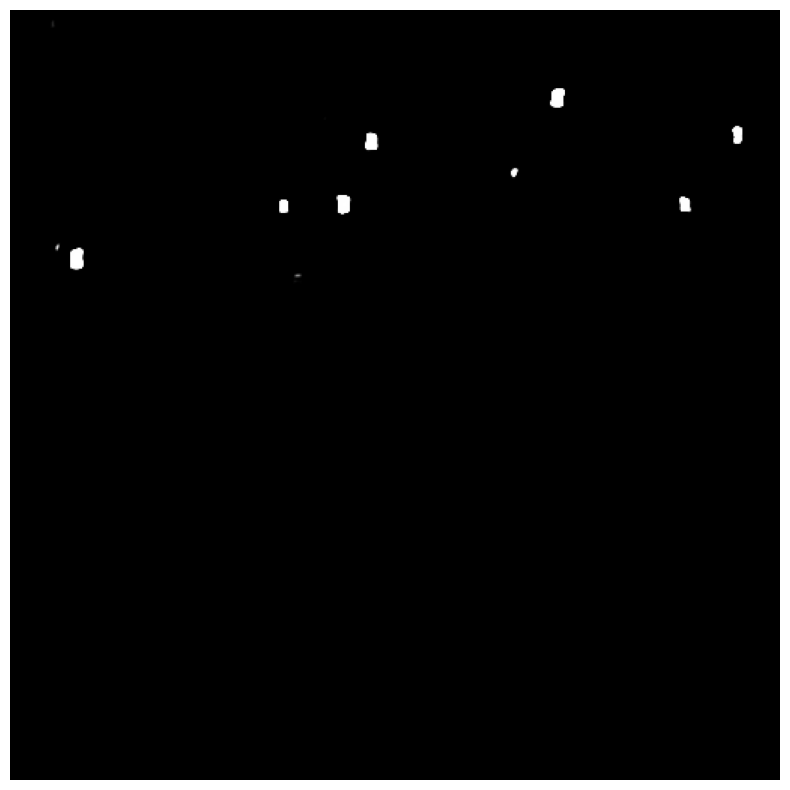



file: /content/Predicted_Images/152 OD-4.png, number of boxes:
	Determinant of Hessian=8




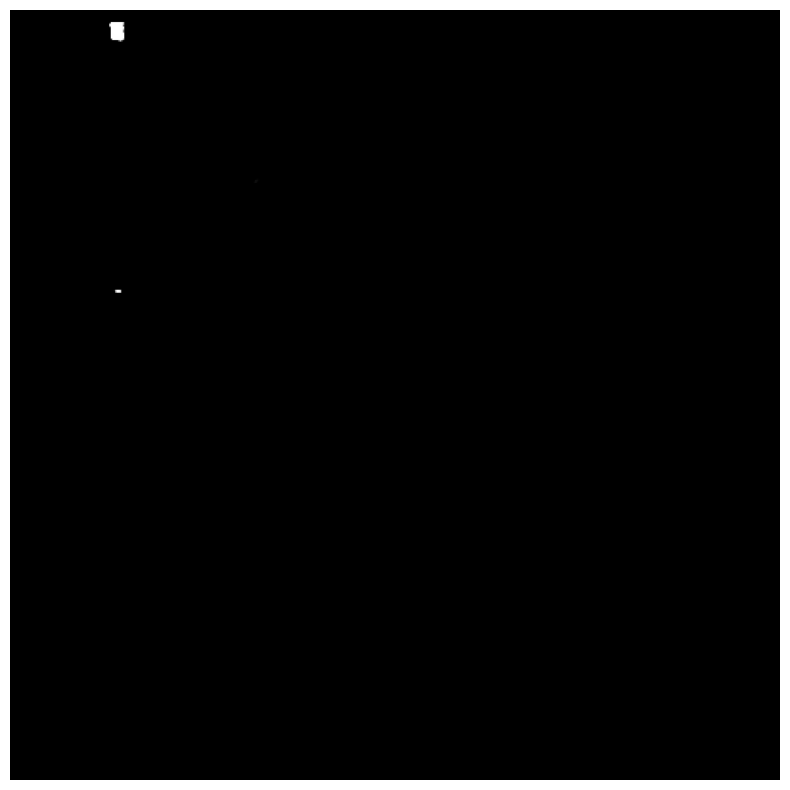



file: /content/Predicted_Images/357 OD-3.png, number of boxes:
	Determinant of Hessian=2




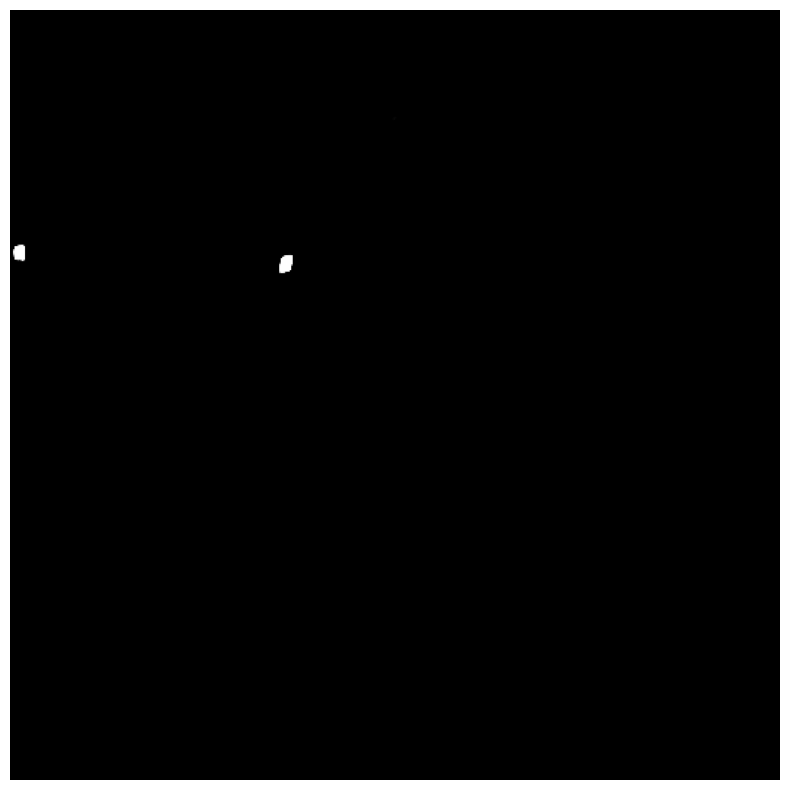



file: /content/Predicted_Images/357 OD-4.png, number of boxes:
	Determinant of Hessian=2




[array([[168.        , 183.        ,   5.97112393],
        [161.        ,   6.        ,   5.97112393]]),
 array([[168.        , 183.        ,   3.62038672],
        [161.        ,   0.        ,   9.26819   ]]),
 array([[167.        , 182.        ,   7.44444444],
        [160.        ,   0.        ,   7.44444444]])]

In [68]:
count_box("/content/Predicted_Images/")